In [1]:
import yaml, os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.gridspec as grid_spec
from mpl_toolkits.axes_grid1 import make_axes_locatable
import plotly.express as px
import joypy

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from src.parameter_distributions import parameter_distributions
from src.feature_extraction import coarsen_density, scale_density, split_data
from src.cluster_data import clustering_pipeline
import sys, importlib
import pyximport
pyximport.install(setup_args={'include_dirs': np.get_include()},
                  language_level = 3
                 )
import src.ks_statistic as ks

## This notebook performs the analysis of Dataset 2 using the Final cell density DV

In [2]:
# Aggregate descriptor data if not already aggregated into the proper file
if not os.path.isfile("../data/dataset2/density.npy"):
    compile_data(2)
    
if not os.path.isfile("../data/dataset2/8x8_density.npy"):
    
    old_density = np.load("../data/dataset2/density.npy", allow_pickle = True)
 
    coarse_resolution = (25)**2
    density = np.empty((45*121*10, coarse_resolution))
    for i, v in enumerate(old_density):
        v = v.reshape(200,200)
        coarse_v = coarsen_density(v, I = 200, h = 1000/(199.0), bin_size = 8)
        density[i] = coarse_v
    
    np.save("../data/dataset2/8x8_density.npy", density, allow_pickle = True)

## Confusion Matrix and OOS Accuracy Computation

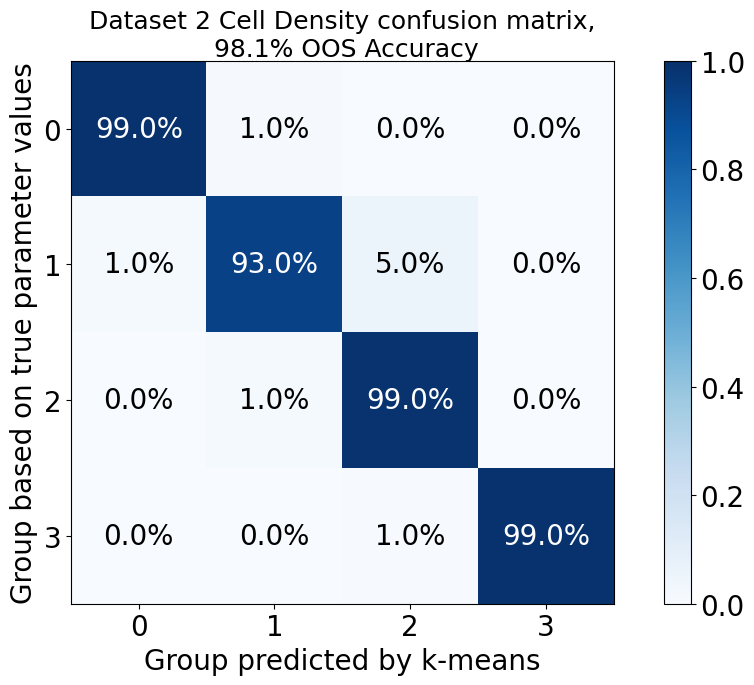

In [3]:
num_clusters = 4
density = np.load("../data/dataset2/8x8_density.npy",allow_pickle = True)
out = clustering_pipeline(X = density,
                    descriptor_name = 'density',
                    title = 'Dataset 2 Cell Density',
                    scaler = scale_density,
                    descriptor_size = 25**2, 
                    num_clusters = num_clusters)

## PCA Projection

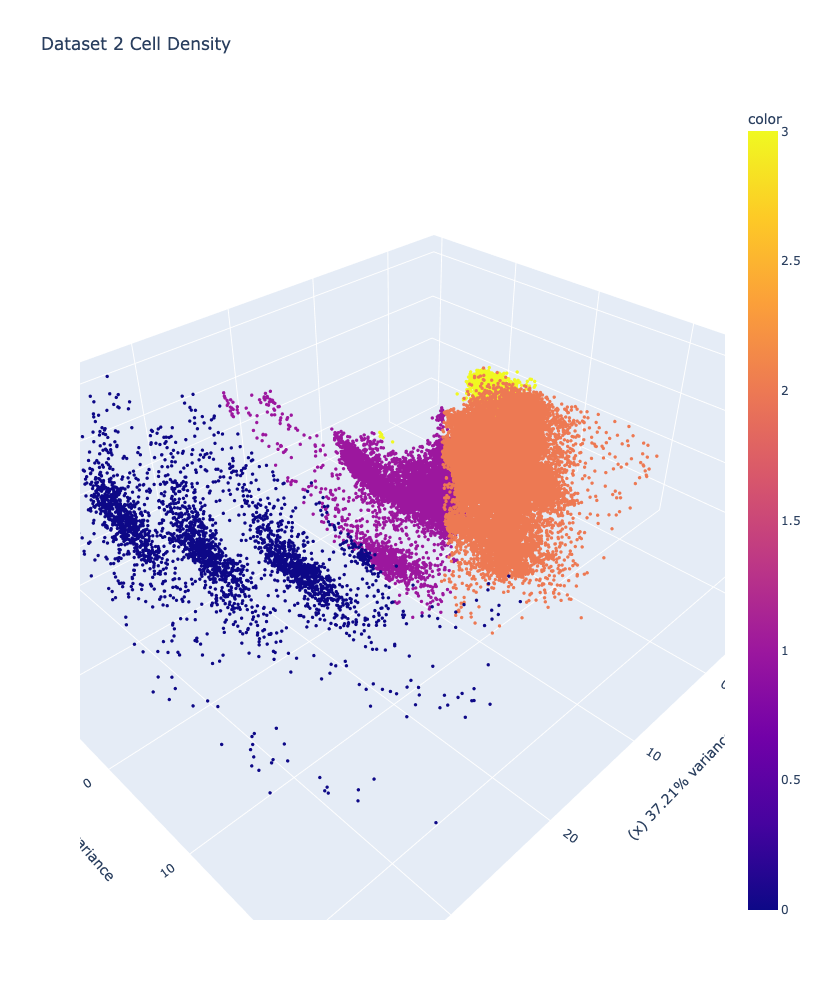

In [4]:
density_reduced = out['X_reduced']
density_labels = out['X_labels']
var = out['explained_variance_ratio']

pca_fig = px.scatter_3d(x=density_reduced[:, 0],
                        y=density_reduced[:, 1],
                        z=density_reduced[:, 2],
                        color=density_labels, labels = {'x': f"(x) {100*var[0]:.2f}% variance",
                                                              'y': f"(y) {100*var[1]:.2f}% variance",
                                                              'z':f"(z) {100*var[2]:.2f}% variance"},
                        title = "Dataset 2 Cell Density")

pca_fig.update_traces(marker={'size': 2})
pca_fig.update_layout(autosize=False,
                             width = 1200,
                             height = 1000)
     
pca_fig.show()

## Locate Representative Phenotypes

In [5]:
# Find the sample closest to the centroid in each cluster
centroids = np.load("../results/dataset2/density_centers.npy", allow_pickle = True)
phenotype_inds = np.empty(num_clusters, dtype = int)

for c in np.arange(num_clusters):
    phenotype_inds[c] = np.argmin(np.linalg.norm(density_reduced - centroids[c], axis = 1))
np.save("../results/dataset2/density_phenotype_inds.npy", phenotype_inds, allow_pickle = True)

## Parameter Distributions 

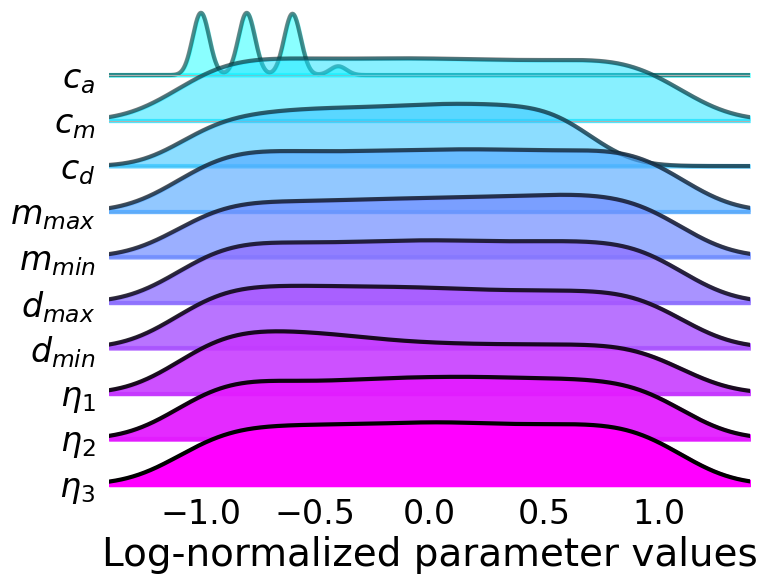

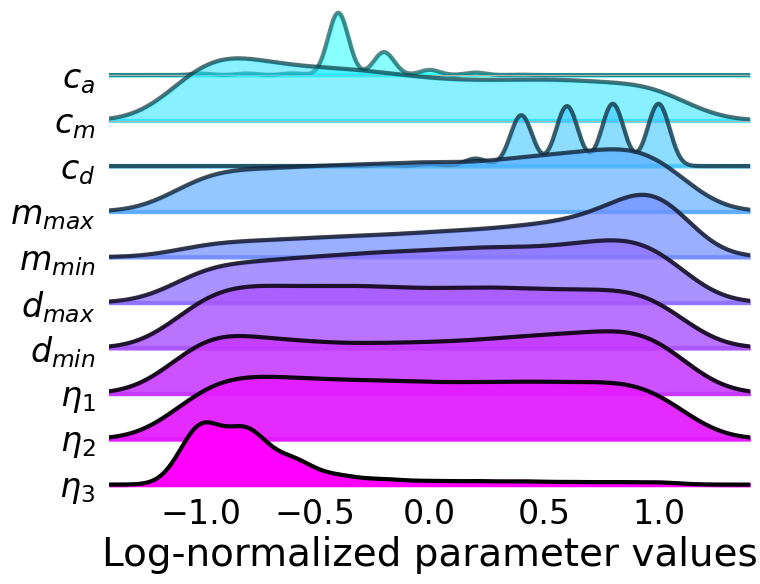

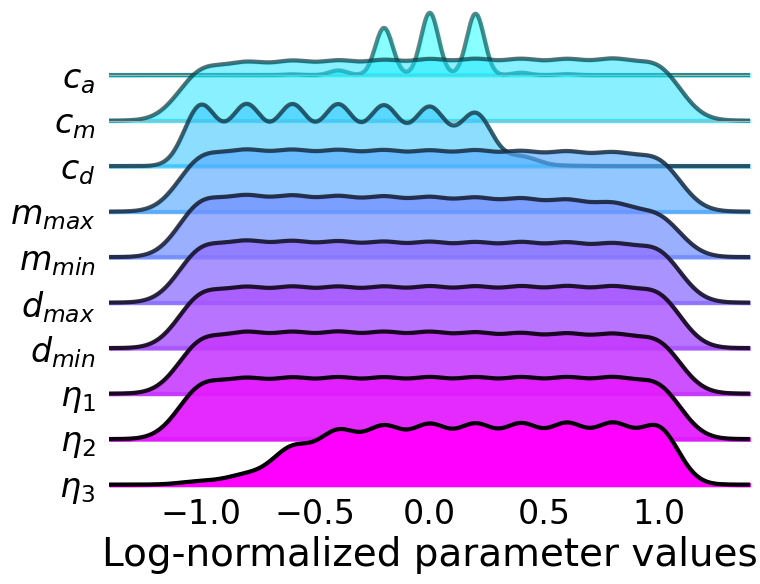

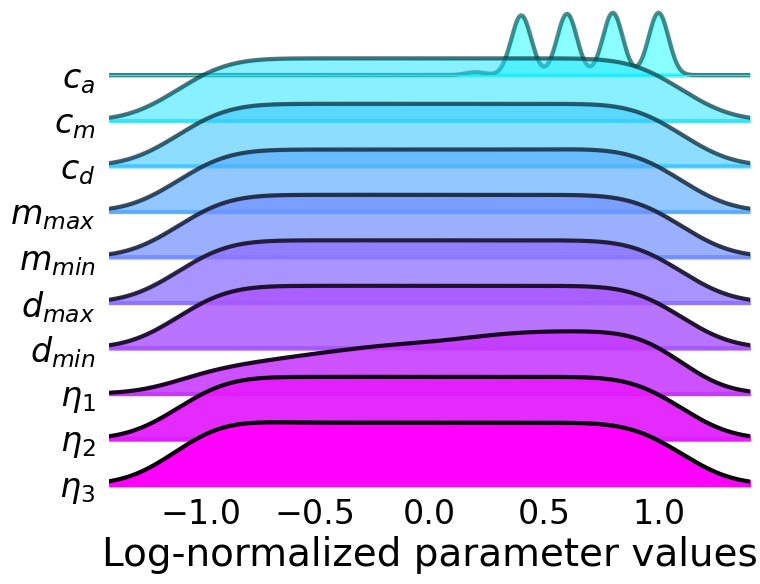

In [6]:
cluster_distns = []
for cluster_num in np.arange(num_clusters):
    cluster_distn = parameter_distributions(labels = density_labels,
                                            cluster_num = cluster_num,
                                            n_itrs = 10)
    cluster_distns.append(cluster_distn)

# Using 1/φ as the overlap parameter for ridgeline plots
o = (1+np.sqrt(5))/2
distns_plot = []

for c in np.arange(num_clusters):
    param_distn_plot = {}
    param_distn_plot['$c_a$'] = cluster_distns[c]['c_a']
    param_distn_plot['$c_m$'] = cluster_distns[c]['c_m']
    param_distn_plot['$c_d$'] = cluster_distns[c]['c_d']
    
    param_distn_plot['$m_{max}$'] = cluster_distns[c]['mmax']
    param_distn_plot['$m_{min}$'] = cluster_distns[c]['mmin']
    param_distn_plot['$d_{max}$'] = cluster_distns[c]['dmax']
    param_distn_plot['$d_{min}$'] = cluster_distns[c]['dmin']
    
    param_distn_plot[r'$\eta_1$'] = cluster_distns[c]['eta1']
    param_distn_plot[r'$\eta_2$'] = cluster_distns[c]['eta2']
    param_distn_plot[r'$\eta_3$'] = cluster_distns[c]['eta3']
    distns_plot.append(param_distn_plot)

# Creating Ridgeline plots of parameter distributions in each cluster
for c in range(num_clusters):
    fig, ax = joypy.joyplot(distns_plot[c],
                            colormap = mpl.colormaps['cool'].resampled(10),
                            figsize = (8,6),
                            linecolor='k',
                            bins = 11,
                            grid = 'y',
                            ylabelsize = 24,
                            xlabelsize = 24,
                            ylim ='own',
                            overlap = 1/(2*o),
                            fade=True,
                            linewidth = 3)
    ax[-1].xaxis.set_ticks_position('none')
    #fig.suptitle(f"Parameter Distributions Cluster {c+1}")
    #plt.show()
    ax[-1].set_xlabel("Log-normalized parameter values",fontsize=28)
    
    fig.savefig(f"../figures/dataset2/density_ridgeline_cluster_{c}.png")

## Compare Clusters with Discrete 2-Sample Kolmogorov-Smirnov Test

In [7]:
param_strings = ["$c_a$","$c_d$","$c_m$", "$d_{max}$","$d_{min}$","$m_{max}$","$m_{min}$","$\\eta_1$","$\\eta_2$","$\\eta_3$"]

ks_stats = {}
permutation_test_iterations = 1000
for param in cluster_distns[0].keys():
    ks_stats[param] = []
    sens_params = 0
    
    for c1 in np.arange(num_clusters):
        for c2 in np.arange(c1 + 1, num_clusters):
            p_val = ks.ks_disc_2sample(samples1 = cluster_distns[c1][param],
                                       samples2 = cluster_distns[c2][param],
                                       iters = permutation_test_iterations)
            
            if p_val < 0.05:
                if p_val < 1e-3:
                    p_val_str = "\\uline{$<10^{-3}$}"
                else:
                    p_val_str = f"\\uline{{ $ {str(round(p_val,3))} $ }}"
                    
                sens_params += 1
            else:
                p_val_str = str(round(p_val,3))
            
            ks_stats[param].append(p_val_str)
            
    if sens_params >= 3:
        ks_stats[param].append("Sensitive")
    else:
        ks_stats[param].append("Insensitive")
    ks_stats[param] = np.array(ks_stats[param])

column_names = [f"{c1+1} \\& {c2+1}" for c1 in np.arange(num_clusters) for c2 in np.arange(c1+1, num_clusters)] + ["Classification"]    
ks_df = pd.DataFrame.from_dict(data = ks_stats,
                               orient = 'index',
                               columns = column_names)
ks_df.index = param_strings

caption = "Determining sensitive Dataset 2 parameters from the Final density DRDV.  We designate $p$-values below 0.05 as being significant. If a parameter is significantly different for the majority of cluster pairs, then we classify the parameter as sensitive."

latex_table = ks_df.to_latex(
    index=True,  # To not include the DataFrame index as a column in the table
    caption=caption,
    label="tab:DS2_KS_final_density",  # A label used for referencing the table within the LaTeX document
    position="h",  # The preferred positions where the table should be placed in the document ('here', 'top', 'bottom', 'page')
    column_format="c|cccccc|c",  # The format of the columns: left-aligend first column and center-aligned remaining columns as per APA guidelines
    escape=False,  # Disable escaping LaTeX special characters in the DataFrame
    float_format="{:0.2f}".format  # Formats floats to two decimal places
)

print(latex_table)

\begin{table}[h]
\caption{Determining sensitive Dataset 2 parameters from the Final density DRDV.  We designate $p$-values below 0.05 as being significant. If a parameter is significantly different for the majority of cluster pairs, then we classify the parameter as sensitive.}
\label{tab:DS2_KS_final_density}
\begin{tabular}{c|cccccc|c}
\toprule
 & 1 \& 2 & 1 \& 3 & 1 \& 4 & 2 \& 3 & 2 \& 4 & 3 \& 4 & Classification \\
\midrule
$c_a$ & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & Sensitive \\
$c_d$ & \uline{$<10^{-3}$} & \uline{ $ 0.016 $ } & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & \uline{$<10^{-3}$} & Sensitive \\
$c_m$ & 0.295 & 0.663 & 0.994 & \uline{$<10^{-3}$} & 0.106 & 0.721 & Insensitive \\
$d_{max}$ & \uline{ $ 0.035 $ } & 0.924 & 1.0 & 0.998 & \uline{ $ 0.019 $ } & 0.909 & Insensitive \\
$d_{min}$ & 0.756 & 0.495 & 0.875 & 0.522 & 0.948 & 0.874 & Insensitive \\
$m_{max}$ & 

In [8]:
%load_ext watermark

%watermark -n -u -v -iv -w

Last updated: Fri May 30 2025

Python implementation: CPython
Python version       : 3.12.4
IPython version      : 8.25.0

yaml      : 6.0.1
src       : 0.0.0
sklearn   : 1.4.2
sys       : 3.12.4 | packaged by Anaconda, Inc. | (main, Jun 18 2024, 15:12:24) [GCC 11.2.0]
pandas    : 2.2.2
numpy     : 1.26.4
matplotlib: 3.8.4
joypy     : 0.2.6
plotly    : 5.24.1

Watermark: 2.5.0

